# **Generative AI Project - Neural style transfer**

 Name: Eoin Houstoun -- University: Goldsmiths -- Module: Artificial Intelligence -- 2024/2025

---
# **1. Project Overview**


![Comic Book Leo](https://github.com/EoinHoustoun/Eoin_Houstoun/blob/master/style_transfer6.gif?raw=true)


## **1.1 Introduction**

Neural Style Transfer (NST) is an application of deep neural networks to create images by combining the content of one image with the style of another, introduced by Gatys et al. in 2015 [1].

The process involves two primary components:
1. **Content:** This represents the high-level structure or macrostructure of an image, such as the shapes, objects, or scenes within it.

2. **Style:** This refers to the artistic elements of an image, such as its textures, colours, and visual patterns.

See Figure 1 below, from François Chollet's book Deep Learning with Python [2]. A photograph of a town in Tübingen is the **content** and the brushstrokes and vibrant colours of Van Gogh's Starry Night is the artistic **style**. Using NST, the combination image is created.

<div style="text-align: center;">
    <p><strong>Figure 1:</strong> NST Example, Chollet[2] </p>
    <img src="https://s3.amazonaws.com/book.keras.io/img/ch8/style_transfer.png" alt="style transfer" width="1000">
</div>


The goal of NST is to generate a new image that keeps the macrostructure and high-level details of the content image while adopting the artistic style of the style image. This blending of content and style is achieved through an optimisation process that minimises a loss function combining both content and style losses, typically computed using a pre-trained model such as VGG19.

NST has applications in art, design, and media production, where it can produce stylized artwork, transform photos into paintings, or create unique visual effects.


## **1.2. Mathematics**

<p><strong>Figure 2:</strong> NST Example, Zhang[3] </p>
<img src="https://d2l.ai/_images/style-transfer.svg" alt="CNN" width="1000">


A **content image** ($\vec{p}$) and a **style image** ($\vec{a}$) are used to generate a third image ($\vec{x}$) that minimizes a weighted combination of two loss functions: **content loss** ($L_{\text{content}}(\vec{p}, \vec{x})$) and the **style loss** ($L_{\text{style}}(\vec{a}, \vec{x})$).

The total loss is defined as a linear combination of these two losses:

$$L_{\text{NST}}(\vec{p}, \vec{a}, \vec{x}) = \alpha .L_{\text{content}}(\vec{p}, \vec{x}) + \beta .L_{\text{style}}(\vec{a}, \vec{x})$$

By minimizing this total loss, Neural Style Transfer (NST) generates an image that combines the content of the content image with the style of the style image. This is shown in the literature by L. A. Gatys, "Image Style Transfer Using Convolutional Neural Networks"[4].

- **Content Loss**: Measures the similarity of two images by comparing the neural activations of a single convolutional neural network (CNN) layer on the content image and the generated image.
- **Style Loss**: Measures the style similarity by comparing the Gram matrices of feature activations across multiple layers of the CNN.

Then, there is a final loss, which works like a regulariser. This is the variation loss. It is calculated by shifting the pixels by 1 in the width and in the height, adding those and looking at the total difference that this produces.

While the original NST paper used the **VGG-19 CNN**, this method is adaptable to other CNN architectures.






The CNN-based style transfer method can be seen in Figure 3.

1.   Initialise the synthesised image
2.   Model parameters to be updated during training
3.   Choose a pretrained CNN to extract image features and freeze its model parameters during training
4.   CNN uses multiple layers to extract hierarchical features for images
5.   Choose the output of some of these layers as content features or style features.
6.   Figure 3's pretrained neural network has 3 convolutional layers, where the second layer outputs the content features, and the first and third layers output the style features.

<p><strong>Figure 3:</strong> CNN-based style transfer process, Zhang[3] </p>
<img src="https://d2l.ai/_images/neural-style.svg" alt="CNN" width="1000">

Solid lines show the direction of forward propagation and dotted lines show backward propagation.

## **1.3 Project Goals**
The primary goal of this project is to implement a NST to transform an image of a celebrity into comic book style. By using the pretrained [VGG19 model](https://www.tensorflow.org/api_docs/python/tf/keras/applications/VGG19?_gl=1*yqrkde*_up*MQ..*_ga*MzM2ODE3MTc3LjE3MzY1OTc4NTQ.*_ga_W0YLR4190T*MTczNjU5Nzg1NC4xLjAuMTczNjU5NzkwMC4wLjAuMA) [5], the project aims to create a new combination image to see if its a feasable way to create accurate comic book visuals of celebrities.

The comic book style was chosen for its bold and vibrant visual characteristics. Comics rely on exaggerated textures, strong colour contrasts, and stylized lines that make them highly recognizable and visually appealing. Applying this style to well-known celebrities demonstrates the creativity of NST's in image generation.

**Key Objectives**

1. Accurate Style Transfer:

  Successfully blend the high-level structure of the input content image with the patterns and textures of comic book styles whilst retaining the identity of the celebrity.

2. Experimentation with Hyperparameters:
  
  Investigate the impact of different hyperparameters, such as content weight, style weight, total variation weight, learning rates, optimizers, and layer selections to fine-tune the balance between content preservation and stylization on the final output.
  
3. Intermediate Visualisations:

  Save intermediate images during training to understand how the style transfer evolves across iterations. This is done by creating a GIF, showing the progression of the style transfer's process.

4. Scalability and Reusability:

  Design modular code that allows me (or someone else) to experiment with different content and style images and easily tweak hyperparameters.

5. Evaluation:
  
  Evaluate the quality of the generated images, considering both aesthetics and content retention. Provide insights into how specific hyperparameters influence the output.

This project not only serves as a creative application of deep learning but also highlights the potential of neural networks in artistic domains such as digital art, graphic design, and media production.

## **1.4 NST Workflow**

Neural Style Transfer Pipeline I created ([My GitHub](https://github.com/EoinHoustoun/Eoin_Houstoun/blob/master/pipeline_NST.png?raw=true))

![NST Pipeline](https://github.com/EoinHoustoun/Eoin_Houstoun/blob/master/pipeline_NST.png?raw=true)



# **2. Programming**

The code used has been heavily influenced and built upon two primary sources:
1. Jérémie Wenger's course *Artificial Intelligence* [NST Jupyter notebook](https://github.com/jchwenger/AI/blob/main/8-generative-deep-learning/chapter12_part03_neural-style-transfer.ipynb)
2. François Chollet's book Deep Learning with Python [2]

## **2.1 Import necessary Packages**

In [1]:
# TensorFlow and Keras for deep learning
import tensorflow as tf
from tensorflow import keras
from tensorflow.python.keras import models, losses, layers, backend as K

# Image processing
from PIL import Image

# Visualisation
import matplotlib.pyplot as plt
from IPython.display import Image, display
from graphviz import Digraph

# Utilities
import numpy as np
import os
import time
import pathlib
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
import imageio #For GIF
import shutil

# Google Colab
from google.colab import drive
drive.mount('/content/drive')  # Accessing dataset from Google Drive
from google.colab.patches import cv2_imshow
import cv2


Mounted at /content/drive


## **2.2 Displaying content & style image**

In [3]:
content_path = "/content/drive/MyDrive/leo.jpeg"
style_path = "/content/drive/MyDrive/supman.jpeg"

In [4]:
# Function to save an image to a directory
def save_image(image, file_name, directory):
    file_path = directory / file_name
    image.save(file_path)
    return file_path

# Function to display images
def display_images(image_paths, titles=None, figsize=(12, 6)):
    num_images = len(image_paths)
    plt.figure(figsize=figsize)

    for i, image_path in enumerate(image_paths):
        plt.subplot(1, num_images, i + 1)
        plt.axis('off')
        if titles and i < len(titles):
            plt.title(titles[i])
        plt.imshow(tf.keras.utils.load_img(image_path))

    plt.show()


In [5]:
from PIL import Image

# Dataset directory
DATASET_DIR = pathlib.Path("neural-style-transfer")
DATASET_DIR.mkdir(exist_ok=True)  # Create the directory if doesn't exist

img1 = Image.open(content_path)
img2 = Image.open(style_path)

# Paths to save images
content_image_path = save_image(img1, "content_image.jpeg", DATASET_DIR)
style_image_path = save_image(img2, "style_image.jpeg", DATASET_DIR)

# Use saved local files with tf.keras.utils.get_file
REF_IMAGE = tf.keras.utils.get_file(
    "content_image.jpeg",
    origin=f"file://{content_image_path.resolve()}",
    cache_dir=str(DATASET_DIR),  # str() for compatibility
    cache_subdir="",
)

STYLE_IMAGE = tf.keras.utils.get_file(
    "style_image.jpeg",
    origin=f"file://{style_image_path.resolve()}",
    cache_dir=str(DATASET_DIR),
    cache_subdir="",
)

print("Content image path:", REF_IMAGE)
print("Style image path:", STYLE_IMAGE)


Content image path: neural-style-transfer/content_image.jpeg
Style image path: neural-style-transfer/style_image.jpeg


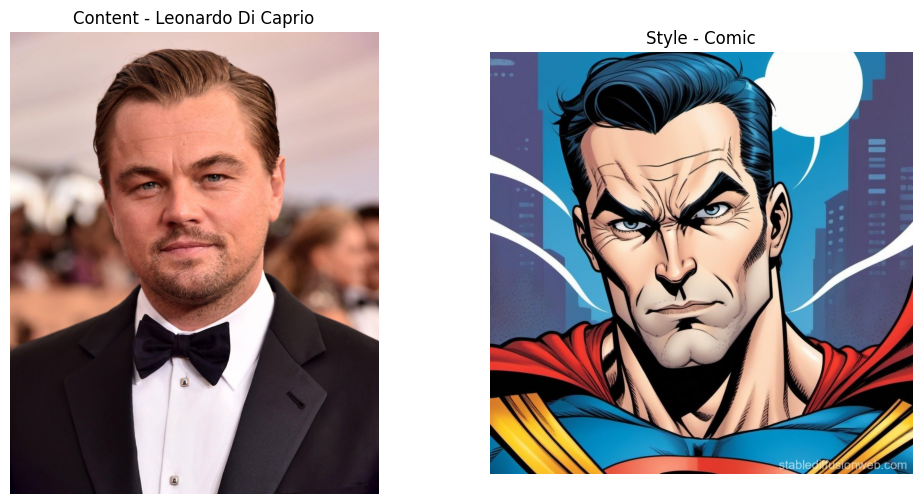

In [6]:
display_images(
    image_paths=[REF_IMAGE, STYLE_IMAGE],
    titles=["Content - Leonardo Di Caprio", "Style - Comic"]
)

The two images share similarities in their overall composition, both focusing on a central figure in a portrait-style orientation. The content image of [Leonardo DiCaprio](https://cdn.britannica.com/65/227665-050-D74A477E/American-actor-Leonardo-DiCaprio-2016.jpg) is a human portrait with natural lighting and detailed textures, whereas the style image is a comic book interpretation of Superman.

Features such as the cheekbones, jawline, and hair in the Superman image have thick outlines and colour contrasts. When these stylistic elements are transferred onto the content image, sharp, bold lines should appear and potentially a more vibrant colour palette.



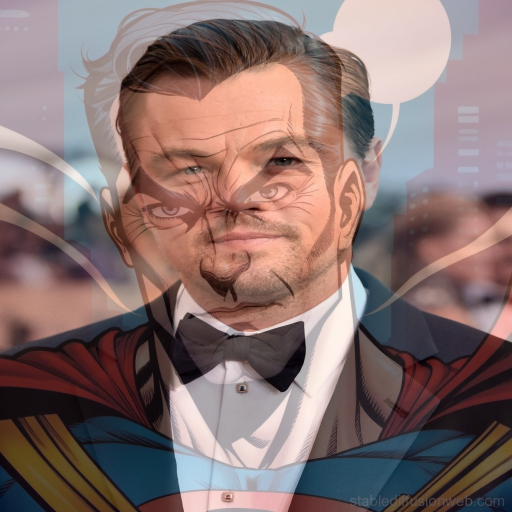

In [7]:
# Baseline Blending Images
image1 = cv2.imread(style_path)
image2 = cv2.imread(content_path)

image2 = cv2.resize(image2, (image1.shape[1], image1.shape[0]))  # (width, height)

alpha = 0.3 #Adjusted
blended = cv2.addWeighted(image1, alpha, image2, 1 - alpha, 0)

resize_factor = 0.5
blended_resized = cv2.resize(blended, (0, 0), fx=resize_factor, fy=resize_factor)

# Save and display the resized blended image
cv2.imwrite('blended_image.jpg', blended_resized)
cv2_imshow(blended_resized)


Mixing these two images using Python's built-in blending functions demonstrates why such a straightforward approach is not a feasible solution for combining images effectively. While this "common sense" baseline provides a simple method, it is worse than the results that NST can achieve.

Beating this baseline should be a straightforward task for the NST model, as the strength of NST lies in its ability to blend content and style at a deeper level. However, it is still worthwhile to explore whether a simpler approach might suffice.

## **2.3 Auxiliary functions**

In [8]:
# Function to calculate new image dimensions
def calculate_new_dimensions(image_path, max_dim=500, keep_original=False):
    try:
        original_width, original_height = tf.keras.utils.load_img(image_path).size
        if keep_original:
            return original_width, original_height

        long_dim = max(original_width, original_height)
        scale = max_dim / long_dim

        img_width = round(original_width * scale)
        img_height = round(original_height * scale)
        return img_width, img_height

    except Exception as e:
        print(f"Error calculating dimensions for image at {image_path}: {e}")
        return None, None


def preprocess_image(image_path):
    img = tf.keras.utils.load_img(                          # load image, specifying the size
        image_path, target_size=(img_height, img_width)
    )
    img = tf.keras.utils.img_to_array(img)                  # to array
    img = np.expand_dims(img, axis=0)                       # add batch dim
    img = tf.keras.applications.vgg19.preprocess_input(img) # specific VGG19 preprocessing
    return img

def deprocess_image(img):
    img = img.reshape((img_height, img_width, 3))
    img[:, :, 0] += 103.939                       # vgg19.preprocess_input zero centers data by
    img[:, :, 1] += 116.779                       # removing the mean channel value from ImageNet:
    img[:, :, 2] += 123.68                        # here, we simply do this process in reverse
    img = img[:, :, ::-1]                         # vgg19.preprocess_input has BGR channels, reversed here to RGB
    img = np.clip(img, 0, 255).astype("uint8")
    return img

## **2.4 Pretrained VGG19 model to create a feature extractor**

In [9]:
# Setting new dimensions
img_width, img_height = calculate_new_dimensions(REF_IMAGE, max_dim=500, keep_original=False)
print(f"New dimensions: {img_width}x{img_height}")

#VGG19 Model
model = tf.keras.applications.vgg19.VGG19(weights="imagenet", include_top=False)

# New model that returns all its layers outputs
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
feature_extractor = tf.keras.Model(inputs=model.inputs, outputs=outputs_dict)

#Preprocess Images
base_image = preprocess_image(REF_IMAGE)
style_reference_image = preprocess_image(STYLE_IMAGE)

New dimensions: 398x500
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


The [VGG19 model](https://keras.io/api/applications/vgg/) is a deep learning network widely used in NST for its ability to capture detailed features. Pretrained on ImageNet, it can identify both low-level details like edges and high-level structures like shapes.

Layers like block5_conv2 are used to preserve the content of the input image.
Intermediate layers (block1_conv1 to block5_conv1) help extract the style through Gram matrices, capturing textures and patterns. A total variation loss is added to keep the generated image smooth and avoid pixelation. VGG19 works well for NST because its weights are fixed and trained on diverse data, however, it's a large model with over 20 million parameters, so it can be slow to run on high-resolution images.

In [10]:
model.summary()

Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, None, None, 3)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, None, None, 64)      │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, None, None, 64)      │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, None, None, 64)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, None, None, 128)     │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, None, None, 128)     │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, None, None, 128)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, None, None, 256)     │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, None, None, 256)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, None, None, 512)     │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, None, None, 512)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 20,024,384 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

## **2.5 Loss Functions**

In [11]:
# Content loss
def content_loss(base_img, combination_img):
    return tf.reduce_sum(tf.square(combination_img - base_img)) # squared distance

# Style loss
def gram_matrix(x):
    """
    Calculate the correlations across features.
    Returns the Gram Matrix, of shape (f, f):
        the correlation score of every feature with itself and all others.
    """
    x = tf.transpose(x, (2, 0, 1))                     # x from (w, h, f) → (f,w,h), features first
    features = tf.reshape(x, (tf.shape(x)[0], -1))     # flatten w & h (-1: "calculate that dimension for me")
    gram = tf.matmul(features, tf.transpose(features)) # matmul: featurewise product & sum over all elements
    return gram

             # ↓ we pass a pre-computed gram matrix for the style image
def style_loss(style_img_gram, combination_img):
    C = gram_matrix(combination_img) # get gram matrix (feature correlations) for the combination image
    channels = 3
    size = img_height * img_width
         # ↓ the squared difference between the correlations of two matrices
    return tf.reduce_sum(tf.square(style_img_gram - C)) / (4.0 * (channels ** 2) * (size ** 2))
                                                         # ↑ normalisation constant

# Function to examine the Gram Matrix
def gram_matrix_v(x, verbose=False):
    """
    A verbose version of the gram matrix function,
    demonstrating how one can use the print function
    to look at the inner workings of the computation.
    """
    if verbose:
        print("x shape:         ", x.shape)
    x = tf.transpose(x, (2, 0, 1))
    if verbose:
        print("x reshaped:      ", x.shape)
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    if verbose:
        print("features shape:  ", features.shape)
        print("transposed shape:", tf.transpose(features).shape)
    gram = tf.matmul(features, tf.transpose(features))
    if verbose:
        print("gram shape:      ", gram.shape)
    return gram

# Total variation loss
def total_variation_loss(x):
    """
    Operation on the generated image: 'encourages spatial continuity in
    the generated image, thus avoiding overly pixelated results', DLWP, p. 388.
    """
    # variations: vertical & horizontal
    a = tf.square( #                                      ↓ shift by one
        x[:, : img_height - 1, : img_width - 1, :] - x[:, 1:, : img_width - 1, :]
    ) #        ↑ reduce overall dims as we shift by 1 pixel, also here ↑

    b = tf.square( #                                                        ↓ shift by one
        x[:, : img_height - 1, : img_width - 1, :] - x[:, : img_height - 1, 1:, :]
    ) #        ↑ reduce overall dims as we shift by 1 pixel, also here ↑

    return tf.reduce_sum(tf.pow(a + b, 1.25)) # somewhat mysterious number here



In [12]:
# Examining the Gram Matrix
gram_matrix_v(preprocess_image(REF_IMAGE)[0], verbose=True)

x shape:          (500, 398, 3)
x reshaped:       (3, 500, 398)
features shape:   (3, 199000)
transposed shape: (199000, 3)
gram shape:       (3, 3)


<tf.Tensor: shape=(3, 3), dtype=float32, numpy=
array([[1.1814139e+09, 1.1882548e+09, 1.2072120e+09],
       [1.1882548e+09, 1.2374222e+09, 1.2764123e+09],
       [1.2072120e+09, 1.2764123e+09, 1.5779402e+09]], dtype=float32)>

In [13]:
def extract_features(base_image, style_reference_image, content_layer_names, style_layer_names):
    num_content_layers = len(content_layer_names)
    num_style_layers = len(style_layer_names)
    # Extract features for content
    content_features = feature_extractor(base_image)
    content_targets = {
        layer_name: content_features[layer_name]
        for layer_name in content_layer_names
    }

    # Extract features for style
    style_features = feature_extractor(style_reference_image)
    style_targets = {
        layer_name: gram_matrix(style_features[layer_name][0])
        for layer_name in style_layer_names
    }

    return content_targets, style_targets, num_content_layers, num_style_layers


In [14]:
#Defining the final loss to minimize
def compute_loss(combination_image):

    content_targets, style_targets, num_content_layers, num_style_layers = extract_features(
    base_image,
    style_reference_image,
    content_layer_names,
    style_layer_names)

    all_combination_features = feature_extractor(combination_image)

    c_loss = tf.zeros(shape=())                                                    # 1. CONTENT LOSS
    for layer_name in content_layer_names:
        base_image_features = content_targets[layer_name][0] # ← no ↓ batch dim    # precomputed content features
        combination_features = all_combination_features[layer_name][0]
        c_loss += content_loss(base_image_features, combination_features)
    c_loss *= content_weight / num_content_layers                                  # weighting and averaging
            # ↑ (all layers with the same weight: could be changed!)

    s_loss = tf.zeros(shape=())                                                    # 2. STYLE LOSS
    for layer_name in style_layer_names:
        style_reference_features = style_targets[layer_name]                       # precomputed style features (grams!)
        combination_features = all_combination_features[layer_name][0]
        s_loss += style_loss(style_reference_features, combination_features)
    s_loss *= style_weight / num_style_layers                                      # weighting and averaging
            # ↑ (all layers with the same weight: could be changed!)

    v_loss = total_variation_weight * total_variation_loss(combination_image)      # 3. VARIATION LOSS
    loss = c_loss + s_loss + v_loss

    return loss, c_loss, s_loss, v_loss # returning everything so I can print values during training!



## **2.6 Variables and Hyperparameters**

---
1. Content Layers: More layers preserves finer details of content image. Too many layers can dilute specific stylistic features.
---
2. Style Layers: More style layers get a broader range of textures and patterns. Can make generated image overpower the content.
---
3. Total Variation Weight: Helps ensure smoothness in the output image. Increasing reduces noise and sharp transitions. Setting too high may make the image overly smooth, losing stylistic detail.
---
4. Content Weight: Higher values prioritise structure and layout of the content image. Lower values may cause the style to dominate.
---
5. Style Weight: Higher style weight ensures textures and patterns from style image are more pronounced. Lower values allow content to dominate.
---
6. Learning Rate: Higher learning rate may speed up convergence but risks going past best image. Lower learning rate provides stability but requires more iterations.
---
7. Optimizer: Optimizers such as Adam (adaptive) or SGD (simple with potential for learning rate decay) are used to update the generated image during optimization. Including the optimizer with @tf.function accelerates the process by compiling it, improving runtime performance.
___

In [15]:
# HYPERPARAMETERS TO TUNE

# 1. Content layer
content_layer_names = [
    "block5_conv2",
]

# content_layer_names = ["block4_conv2", "block5_conv2"]

 # 2. Style layers
style_layer_names = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
]

# 3. 4. 5. Weights
total_variation_weight = 1e-6
content_weight = 1e-6
style_weight = 1e-6

# 6. Learning Rate
learning_rate = 100.


# Setting up the gradient-descent process
@tf.function # make it fast by compiling the function with @tf.function!
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss, c_loss, s_loss, v_loss = compute_loss(combination_image)
    grads = tape.gradient(loss, combination_image)
    optimizer.apply_gradients([(grads, combination_image)])
    return loss, c_loss, s_loss, v_loss

# 7. Optimizer
# ADAM
optimizer = tf.keras.optimizers.Adam(
    learning_rate=learning_rate,
    beta_1=0.99,
    epsilon=1e-1
)

# # SGD
# optimizer = tf.keras.optimizers.SGD(
#     tf.keras.optimizers.schedules.ExponentialDecay( # gradually lowers the learning rate!
#         initial_learning_rate=learning_rate,
#         decay_steps=100,
#         decay_rate=0.96
#     )
# )


## **2.7 Style Transfer Function**

This function runs the neural style transfer. It saves intermediate results and the final stylized image. Intermediate images are saved to create GIFs. The function made it easy to run multiple tests.

In [16]:
def run_experiment_with_intermediate_saves(
    content_weight,
    style_weight,
    total_variation_weight,
    learning_rate,
    iterations=1000,
    save_every=50,
    experiment_id=1,
):
    """
    Runs style transfer with saving intermediate steps for GIF.
    """

    # Initialise combination image
    combination_image = tf.Variable(preprocess_image(REF_IMAGE))

    # Directories to save results
    results_dir = DATASET_DIR / "experiment_results"
    intermediate_dir = results_dir / f"experiment_{experiment_id}_intermediates"
    results_dir.mkdir(exist_ok=True)
    intermediate_dir.mkdir(exist_ok=True)

    intermediate_images = []  # To store intermediate results for GIF
    original_image = deprocess_image(preprocess_image(REF_IMAGE)[0])
    intermediate_images.insert(0, original_image) # Gif to begin with original content image

    for i in range(1, iterations + 1):
        # Perform gradient descent
        start = time.time()
        loss, c_loss, s_loss, var_loss = compute_loss_and_grads(
            combination_image, base_image, style_reference_image
        )
        end = time.time()

        # Save intermediate results
        if i % save_every == 0 or i == iterations:
            img = deprocess_image(combination_image.numpy())
            intermediate_fname = intermediate_dir / f"step_{i}.png"
            tf.keras.utils.save_img(intermediate_fname, img)
            intermediate_images.append(img)  # Append for GIF

            print(
                f"Iteration {i} | Loss: {loss.numpy():,.2f} | "
                f"Content: {c_loss.numpy():,.2f}, Style: {s_loss.numpy():,.2f}, "
                f"Variation: {var_loss.numpy():,.2f} | Time: {end - start:.2f}s"
            )

    # Save final image in main results directory
    final_image_path = results_dir / f"result_{experiment_id}.png"
    tf.keras.utils.save_img(final_image_path, img)

    print(f"Final image saved at: {final_image_path}")

    return intermediate_images, results_dir, final_image_path


Simple Function to create the gif

In [17]:
def create_gif(images, output_path, fps=10):
    imageio.mimsave(output_path, images, fps=fps, loop=0) #loop=0 means infinite loop
    print(f"GIF saved at {output_path}")


# **3. Testing**

With so many hyperparameters available to tune, running a large-scale experiment covering all possible combinations was computationally infeasible. Therefore, I chose to narrow the scope by adjusting one or two hyperparameters at a time, allowing for a more focused exploration of their effects.

## **Test 1 - Adam Optimizer**

Hyperparameters:

1. Content layer
content_layer_names = ["block5_conv2"]
2. Style layers
style_layer_names = [ "block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1", "block5_conv1"]

3. total_variation_weight = 1e-6   
4. content_weight = 1e-6             
5. style_weight = 1e-6             

6. Learning Rate
learning_rate = 100.

7. Optimizer = ADAM



In [18]:
intermediate_images, results_dir, final_image_path = run_experiment_with_intermediate_saves(
    content_weight,
    style_weight,
    total_variation_weight,
    learning_rate,
    iterations=1000, #Amount of iterations
    save_every=50,   #Lower for Smoother GIF
    experiment_id=1,
)

#Begin GIF with original conent image
original_image = deprocess_image(preprocess_image(REF_IMAGE)[0])
intermediate_images.insert(0, original_image)

# Create GIF
gif_path = results_dir / "style_transfer1.gif"
create_gif(intermediate_images, gif_path, fps=10)


Iteration 50 | Loss: 20,255.42 | Content: 1,240.39, Style: 11,881.69, Variation: 7,133.33 | Time: 0.15s
Iteration 100 | Loss: 13,211.26 | Content: 1,100.23, Style: 5,929.58, Variation: 6,181.45 | Time: 0.15s
Iteration 150 | Loss: 9,442.39 | Content: 975.37, Style: 3,750.86, Variation: 4,716.16 | Time: 0.16s
Iteration 200 | Loss: 7,592.69 | Content: 889.53, Style: 2,704.60, Variation: 3,998.56 | Time: 0.16s
Iteration 250 | Loss: 6,444.64 | Content: 802.17, Style: 2,147.51, Variation: 3,494.96 | Time: 0.16s
Iteration 300 | Loss: 5,668.24 | Content: 733.24, Style: 1,833.92, Variation: 3,101.09 | Time: 0.17s
Iteration 350 | Loss: 5,137.57 | Content: 673.35, Style: 1,644.75, Variation: 2,819.47 | Time: 0.16s
Iteration 400 | Loss: 4,754.51 | Content: 627.63, Style: 1,500.93, Variation: 2,625.95 | Time: 0.16s
Iteration 450 | Loss: 4,471.74 | Content: 586.88, Style: 1,398.92, Variation: 2,485.95 | Time: 0.17s
Iteration 500 | Loss: 4,256.97 | Content: 557.28, Style: 1,320.29, Variation: 2,379.4

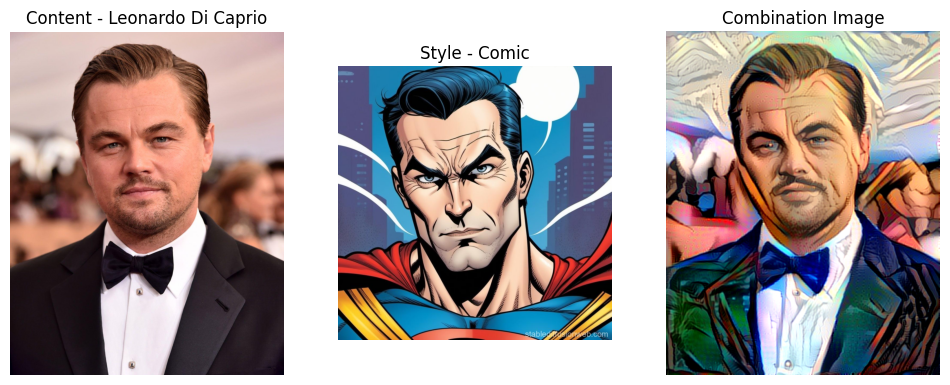

In [19]:
from IPython.display import Image as IPImage, display
display_images(
    image_paths=[REF_IMAGE, STYLE_IMAGE, final_image_path],
    titles=["Content - Leonardo Di Caprio", "Style - Comic", "Combination Image"]
)

The first test produced a combination image that was overall quite successful. The content of the image remained easily recognizable, and the style was effectively captured, as seen by the strong lines, shading, and vibrant colours that were well-integrated into the final image. However, one notable issue is the distortion of facial features, particularly around the eyes and mouth, which appear slightly disfigured. This is an area that could be improved to achieve a better result. By changing some hyperparameters, I looked to address this.

In [20]:
#Total duration calc
fps=10
gif_duration = len(intermediate_images) / fps  # Duration in seconds
print(f"Total GIF Duration: {gif_duration:.2f} seconds")

# Display the GIF
display(IPImage(gif_path))


Output hidden; open in https://colab.research.google.com to view.

The GIF provides a cool visualisation of the iterative process of style transfer, showing how the content image gradually transforms into the stylized image. The difference in the final loss becomes more noticeable in the earlier iterations, as evidenced by the testing results: the loss starts at 20,255, decreases to 13,211, then 9,442, and 7,593. Beyond this point, the loss reduction slows significantly, dropping by increments of 1,000 and eventually into the hundreds until it reaches 3,492 at the final iteration.

Given this gradual loss reduction, I decided to experiment with the SGD optimizer. Its decay rate decreases the learning rate over time, aligning well with the observed pattern of diminishing values in the loss values.


## **Test 2 - SGD Optimizer**

Hyperparameters:

1. Content layer
content_layer_names = ["block5_conv2"]
2. Style layers
style_layer_names = [ "block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1", "block5_conv1"]

3. total_variation_weight = 1e-6   
4. content_weight = 1e-6             
5. style_weight = 1e-6             

6. Learning Rate
learning_rate = 100.

7. Optimizer = SGD

Keeping all hyperparameters the same as test 1 except trying SGD Optimizer

In [21]:
#Hyperparameters

# Setting up the gradient-descent process
@tf.function # make it fast by compiling the function with @tf.function!
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss, c_loss, s_loss, v_loss = compute_loss(combination_image)
    grads = tape.gradient(loss, combination_image)
    optimizer.apply_gradients([(grads, combination_image)])
    return loss, c_loss, s_loss, v_loss


# Chollet has vanilla SGD + learning rate decay:
optimizer = tf.keras.optimizers.SGD(
    tf.keras.optimizers.schedules.ExponentialDecay( # gradually lowers the learning rate!
        initial_learning_rate=learning_rate,
        decay_steps=100,
        decay_rate=0.96
    )
)


In [22]:
intermediate_images, results_dir, final_image_path = run_experiment_with_intermediate_saves(
    content_weight,
    style_weight,
    total_variation_weight,
    learning_rate,
    iterations=1000, #Amount of iterations
    save_every=50,   #Lower for Smoother GIF
    experiment_id=2,
)

original_image = deprocess_image(preprocess_image(REF_IMAGE)[0])
intermediate_images.insert(0, original_image)

# Create GIF
gif_path = results_dir / "style_transfer2.gif"
create_gif(intermediate_images, gif_path, fps=10)


Iteration 50 | Loss: 9,875.29 | Content: 909.62, Style: 6,301.37, Variation: 2,664.30 | Time: 0.16s
Iteration 100 | Loss: 7,575.38 | Content: 807.80, Style: 4,169.85, Variation: 2,597.73 | Time: 0.17s
Iteration 150 | Loss: 6,652.04 | Content: 741.86, Style: 3,365.36, Variation: 2,544.82 | Time: 0.17s
Iteration 200 | Loss: 6,133.97 | Content: 699.17, Style: 2,930.52, Variation: 2,504.28 | Time: 0.17s
Iteration 250 | Loss: 5,796.93 | Content: 667.11, Style: 2,658.28, Variation: 2,471.54 | Time: 0.16s
Iteration 300 | Loss: 5,557.24 | Content: 642.57, Style: 2,471.16, Variation: 2,443.51 | Time: 0.16s
Iteration 350 | Loss: 5,373.65 | Content: 623.50, Style: 2,330.59, Variation: 2,419.57 | Time: 0.17s
Iteration 400 | Loss: 5,229.17 | Content: 608.27, Style: 2,221.60, Variation: 2,399.30 | Time: 0.17s
Iteration 450 | Loss: 5,110.46 | Content: 594.79, Style: 2,134.09, Variation: 2,381.57 | Time: 0.16s
Iteration 500 | Loss: 5,011.02 | Content: 583.23, Style: 2,061.97, Variation: 2,365.82 | Tim

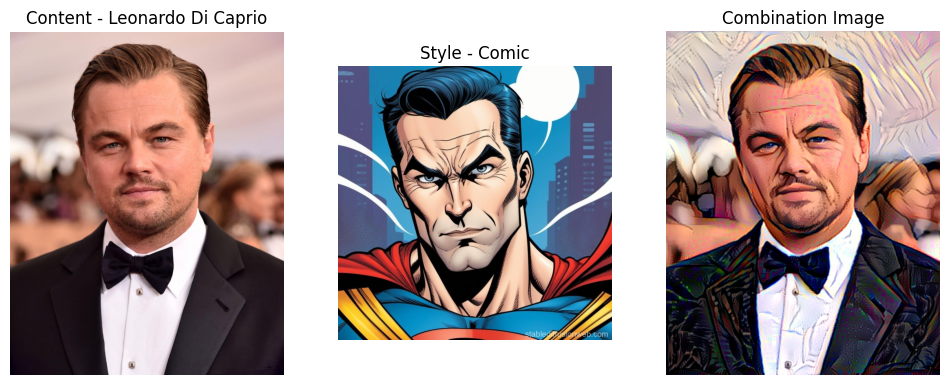

In [23]:
display_images(
    image_paths=[REF_IMAGE, STYLE_IMAGE, final_image_path],
    titles=["Content - Leonardo Di Caprio", "Style - Comic", "Combination Image"]
)

In [24]:
#Total duration calc
fps=10
gif_duration = len(intermediate_images) / fps  # Duration in seconds
print(f"Total GIF Duration: {gif_duration:.2f} seconds")

# Display the GIF
display(IPImage(gif_path))

Output hidden; open in https://colab.research.google.com to view.

This gif of test 2 shows a more subtle change in image as we can see the comic book style lines appear on to DiCaprio.

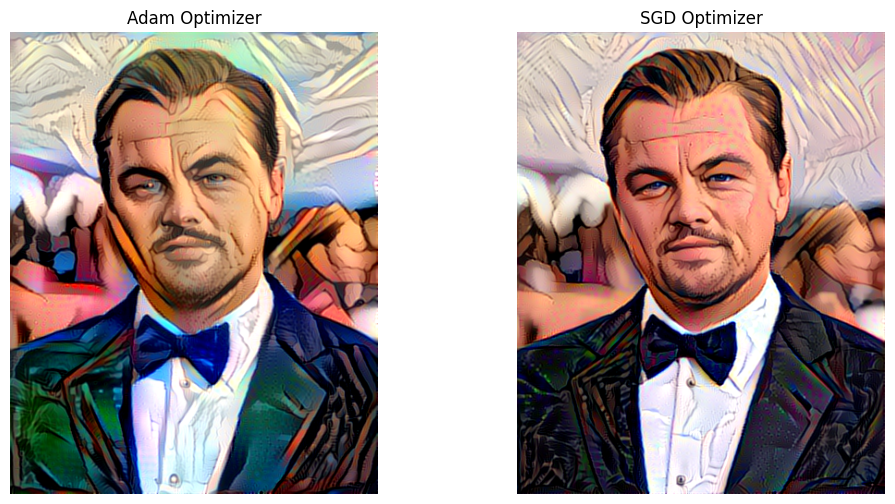

In [25]:
display_images(
    image_paths=["neural-style-transfer/experiment_results/result_1.png", final_image_path],
    titles=["Adam Optimizer", "SGD Optimizer"]
)

The result of Test 2, which used the SGD optimizer, differed from Test 1 (Adam optimizer). The facial features, which were distorted in Test 1, were noticeably improved in Test 2, and the strong lines characteristic of the style were preserved. However, the vibrant colours associated with a classic comic book style were largely diminished in Test 2.

The evaluation of the results depends on what is the goal. Test 2 would be considered a stronger image in isolation due to its refined facial features. However, Test 1 with the Adam optimizer shows potential for further improvement, especially by fine-tuning other hyperparameters with the vibrant colour style while retaining the improved facial structure.

I did additional tests using both optimizers as I was not convinced one was better than the other at this stage of the testing.

## **Test 3 - Extra Content Layer**

Hyperparameters:

1. Content layer
content_layer_names = ["block4_conv2", "block5_conv2"]
2. Style layers
style_layer_names = [ "block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1", "block5_conv1"]

3. total_variation_weight = 1e-6   
4. content_weight = 1e-6             
5. style_weight = 1e-6             

6. Learning Rate
learning_rate = 100.

7. Optimizer = SGD


For this test, the setup remained the same as Test 2, with the only change being the addition of an extra content layer. Adding more content layers retains more structural details from the original content image.

The expectation is that the resulting image to display a more prominent representation of the content image, preserving finer details.

In [26]:
# HYPERPARAMETERS TO TUNE

# 1. Content layer
content_layer_names = ["block4_conv2", "block5_conv2"]


Iteration 50 | Loss: 175,835.55 | Content: 109,712.25, Style: 61,804.00, Variation: 4,319.29 | Time: 0.16s
Iteration 100 | Loss: 161,614.97 | Content: 101,061.79, Style: 55,682.83, Variation: 4,870.35 | Time: 0.16s
Iteration 150 | Loss: 150,223.58 | Content: 89,736.45, Style: 55,487.61, Variation: 4,999.52 | Time: 0.17s
Iteration 200 | Loss: 146,675.56 | Content: 86,745.78, Style: 54,704.54, Variation: 5,225.26 | Time: 0.17s
Iteration 250 | Loss: 141,751.69 | Content: 83,020.76, Style: 53,480.73, Variation: 5,250.18 | Time: 0.16s
Iteration 300 | Loss: 141,466.27 | Content: 81,612.63, Style: 54,564.13, Variation: 5,289.50 | Time: 0.16s
Iteration 350 | Loss: 138,056.88 | Content: 79,815.34, Style: 53,016.25, Variation: 5,225.28 | Time: 0.16s
Iteration 400 | Loss: 134,646.89 | Content: 78,438.03, Style: 50,950.49, Variation: 5,258.37 | Time: 0.16s
Iteration 450 | Loss: 133,834.09 | Content: 74,028.76, Style: 54,636.54, Variation: 5,168.80 | Time: 0.16s
Iteration 500 | Loss: 132,263.47 | C

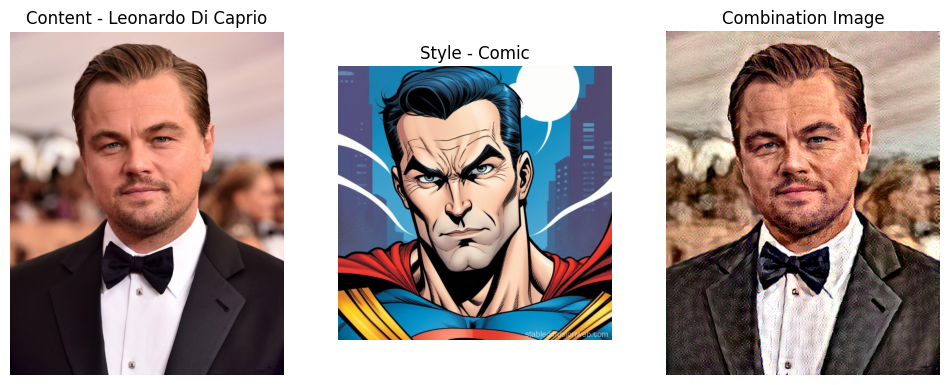

In [27]:
intermediate_images, results_dir, final_image_path = run_experiment_with_intermediate_saves(
    content_weight,
    style_weight,
    total_variation_weight,
    learning_rate,
    iterations=1000, #Amount of iterations
    save_every=50,   #Lower for Smoother GIF
    experiment_id=3,
)

original_image = deprocess_image(preprocess_image(REF_IMAGE)[0])
intermediate_images.insert(0, original_image)

# Create GIF
gif_path = results_dir / "style_transfer3.gif"
create_gif(intermediate_images, gif_path, fps=10)

display_images(
    image_paths=[REF_IMAGE, STYLE_IMAGE, final_image_path],
    titles=["Content - Leonardo Di Caprio", "Style - Comic", "Combination Image"]
)

The image generated from Test 3 demonstrates the consequences of poorly tweaking hyperparameters. By adding an extra content layer, the style elements were almost entirely lost, resulting in a distorted version of the content image. This highlights the importance of understanding the role of each hyperparameter and how it impacts the final output. While adding an additional content layer might be useful if the structure of the content image were not preserved, this adjustment was unnecessary in our case. Test 2 already achieved a satisfactory balance between maintaining the content structure and incorporating the style. This experiment emphasizes the need for deliberate tuning based on the specific goals for the generated image.

## **Test 4 - Remove Style Layer** (Block 5)

Hyperparameters:

1. Content layer
content_layer_names = ["block5_conv2"]
2. Style layers
style_layer_names = [ "block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1"]

3. total_variation_weight = 1e-6   
4. content_weight = 1e-6             
5. style_weight = 1e-6             

6. Learning Rate
learning_rate = 100.

7. Optimizer = Adam

In this test, I reverted the content layer to a single layer and switched the optimizer back to Adam. Additionally, I removed a style layer ("block5_conv1"). The decision to remove this specific style layer was based on observations from Test 1, where the facial features, such as the eyes and mouth, appeared distorted. The "block5_conv1" layer is one of the deeper layers in the network, capturing high-level, abstract features rather than finer details. By excluding this layer, the goal was to reduce the influence of these broader, less detailed style patterns and potentially preserve the facial features better while maintaining the overall stylistic transformation.




In [29]:
# HYPERPARAMETERS TO TUNE

# 1. Content layer
content_layer_names = [
    "block5_conv2",
]

 # 2. Style layers
style_layer_names = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
]


# Setting up the gradient-descent process
@tf.function # make it fast by compiling the function with @tf.function!
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss, c_loss, s_loss, v_loss = compute_loss(combination_image)
    grads = tape.gradient(loss, combination_image)
    optimizer.apply_gradients([(grads, combination_image)])
    return loss, c_loss, s_loss, v_loss


# 7. Optimizer
# ADAM
optimizer = tf.keras.optimizers.Adam(
    learning_rate=learning_rate,
    beta_1=0.99,
    epsilon=1e-1
)


Iteration 50 | Loss: 24,598.62 | Content: 1,333.22, Style: 15,063.09, Variation: 8,202.31 | Time: 0.15s
Iteration 100 | Loss: 15,007.07 | Content: 1,184.68, Style: 7,232.19, Variation: 6,590.19 | Time: 0.15s
Iteration 150 | Loss: 10,703.13 | Content: 1,078.55, Style: 4,477.82, Variation: 5,146.76 | Time: 0.16s
Iteration 200 | Loss: 8,491.57 | Content: 982.96, Style: 3,132.99, Variation: 4,375.62 | Time: 0.15s
Iteration 250 | Loss: 7,138.75 | Content: 893.73, Style: 2,452.47, Variation: 3,792.56 | Time: 0.15s
Iteration 300 | Loss: 6,222.62 | Content: 803.62, Style: 2,060.90, Variation: 3,358.10 | Time: 0.15s
Iteration 350 | Loss: 5,604.91 | Content: 733.62, Style: 1,808.27, Variation: 3,063.02 | Time: 0.15s
Iteration 400 | Loss: 5,162.96 | Content: 676.22, Style: 1,633.99, Variation: 2,852.75 | Time: 0.15s
Iteration 450 | Loss: 4,838.03 | Content: 633.48, Style: 1,508.82, Variation: 2,695.73 | Time: 0.15s
Iteration 500 | Loss: 4,594.92 | Content: 601.16, Style: 1,414.71, Variation: 2,57

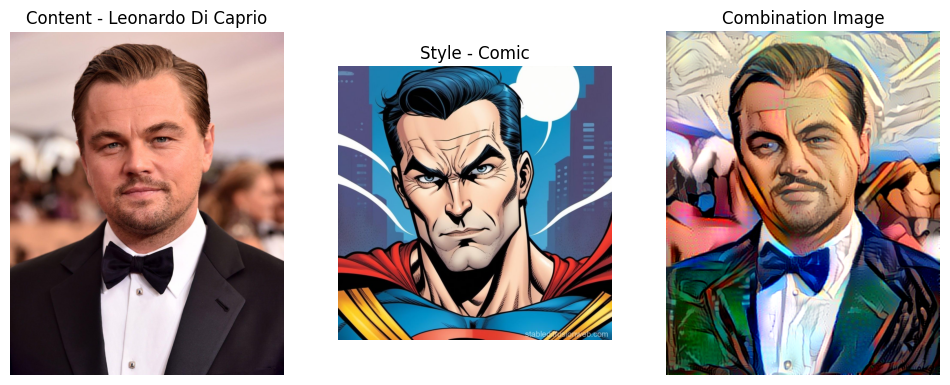

In [30]:
intermediate_images, results_dir, final_image_path = run_experiment_with_intermediate_saves(
    content_weight,
    style_weight,
    total_variation_weight,
    learning_rate,
    iterations=1000, #Amount of iterations
    save_every=50,   #Lower for Smoother GIF
    experiment_id=4,
)

original_image = deprocess_image(preprocess_image(REF_IMAGE)[0])
intermediate_images.insert(0, original_image)

# Create GIF
gif_path = results_dir / "style_transfer4.gif"
create_gif(intermediate_images, gif_path, fps=10)

display_images(
    image_paths=[REF_IMAGE, STYLE_IMAGE, final_image_path],
    titles=["Content - Leonardo Di Caprio", "Style - Comic", "Combination Image"]
)

In [31]:
#Total duration calc
fps=10
gif_duration = len(intermediate_images) / fps  # Duration in seconds
print(f"Total GIF Duration: {gif_duration:.2f} seconds")

# Display the GIF
display(IPImage(gif_path))

Output hidden; open in https://colab.research.google.com to view.

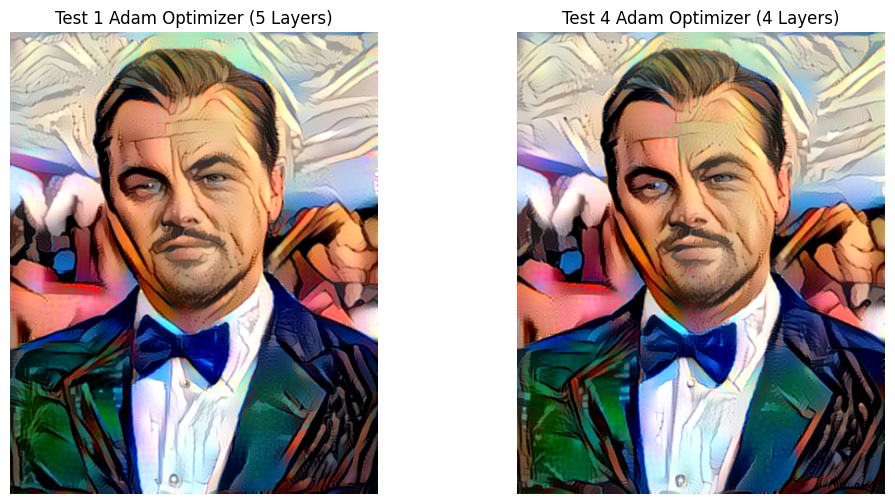

In [127]:
display_images(
    image_paths=["neural-style-transfer/experiment_results/result_1.png", "neural-style-transfer/experiment_results/result_4.png"],
    titles=["Test 1 Adam Optimizer (5 Layers)", "Test 4 Adam Optimizer (4 Layers)"]
)

There was very little difference in the outputs of test 1 and 4. The only change in the hyperparameters was the inclusion of "block1_conv1" in test 1. In my opinion, the image from test 1 is more visually appealing, particularly due to the colours around the forehead and eye area. As a result, in future tests, I retain the "block5_conv1" style layer. Removing different layers has varying effects, so for the next test, I removed the "block1_conv1" style layer.

## **Test 5 - Remove Style Layer** (Block 1)

Hyperparameters:

1. Content layer
content_layer_names = ["block4_conv2"]
2. Style layers
style_layer_names = ["block2_conv1", "block3_conv1", "block4_conv1", "block5_conv1"]

3. total_variation_weight = 1e-6   
4. content_weight = 1e-6             
5. style_weight = 1e-6             

6. Learning Rate
learning_rate = 100.

7. Optimizer = Adam

Compared to our original hyperparameters in test 1, this test only has one difference. I removed style layer block 1. The rationale behind this decision was that block1_conv1 captures low-level features. While these features are important, they can dominate the style representation in the generated image.




In [41]:
# HYPERPARAMETERS TO TUNE

# 1. Content layer
content_layer_names = [
    "block5_conv2",
]

 # 2. Style layers
style_layer_names = [
    #"block1_conv1",  REMOVED
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1"
]

# 3. 4. 5. Weights
total_variation_weight = 1e-6
content_weight = 1e-6
style_weight = 1e-6

# 6. Learning Rate
learning_rate = 100.


# Setting up the gradient-descent process
@tf.function # make it fast by compiling the function with @tf.function!
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss, c_loss, s_loss, v_loss = compute_loss(combination_image)
    grads = tape.gradient(loss, combination_image)
    optimizer.apply_gradients([(grads, combination_image)])
    return loss, c_loss, s_loss, v_loss


# 7. Optimizer
# ADAM
optimizer = tf.keras.optimizers.Adam(
    learning_rate=learning_rate,
    beta_1=0.95,
    epsilon=1e-1
)


Iteration 50 | Loss: 12,634.11 | Content: 1,099.71, Style: 5,844.75, Variation: 5,689.65 | Time: 0.16s
Iteration 100 | Loss: 6,400.83 | Content: 789.37, Style: 2,377.49, Variation: 3,233.97 | Time: 0.16s
Iteration 150 | Loss: 5,234.83 | Content: 647.23, Style: 1,822.67, Variation: 2,764.93 | Time: 0.16s
Iteration 200 | Loss: 4,786.08 | Content: 591.00, Style: 1,610.47, Variation: 2,584.61 | Time: 0.16s
Iteration 250 | Loss: 4,528.91 | Content: 557.80, Style: 1,490.31, Variation: 2,480.80 | Time: 0.16s
Iteration 300 | Loss: 4,355.55 | Content: 535.02, Style: 1,409.16, Variation: 2,411.36 | Time: 0.16s
Iteration 350 | Loss: 4,227.96 | Content: 519.23, Style: 1,349.24, Variation: 2,359.48 | Time: 0.16s
Iteration 400 | Loss: 4,125.76 | Content: 506.50, Style: 1,301.65, Variation: 2,317.61 | Time: 0.15s
Iteration 450 | Loss: 4,039.75 | Content: 495.32, Style: 1,261.37, Variation: 2,283.06 | Time: 0.15s
Iteration 500 | Loss: 3,966.54 | Content: 486.24, Style: 1,227.23, Variation: 2,253.07 | 

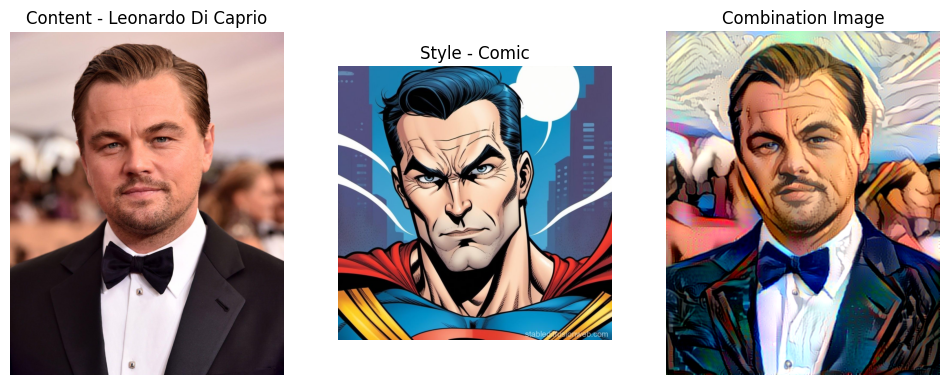

In [43]:
intermediate_images, results_dir, final_image_path = run_experiment_with_intermediate_saves(
    content_weight,
    style_weight,
    total_variation_weight,
    learning_rate,
    iterations=1000, #Amount of iterations
    save_every=50,   #Lower for Smoother GIF
    experiment_id=5,
)

original_image = deprocess_image(preprocess_image(REF_IMAGE)[0])
intermediate_images.insert(0, original_image)

# Create GIF
gif_path = results_dir / "style_transfer5.gif"
create_gif(intermediate_images, gif_path, fps=10)

display_images(
    image_paths=[REF_IMAGE, STYLE_IMAGE, final_image_path],
    titles=["Content - Leonardo Di Caprio", "Style - Comic", "Combination Image"]
)

In [44]:
#Total duration calc
fps=10
gif_duration = len(intermediate_images) / fps  # Duration in seconds
print(f"Total GIF Duration: {gif_duration:.2f} seconds")

# Display the GIF
display(IPImage(gif_path))

Output hidden; open in https://colab.research.google.com to view.

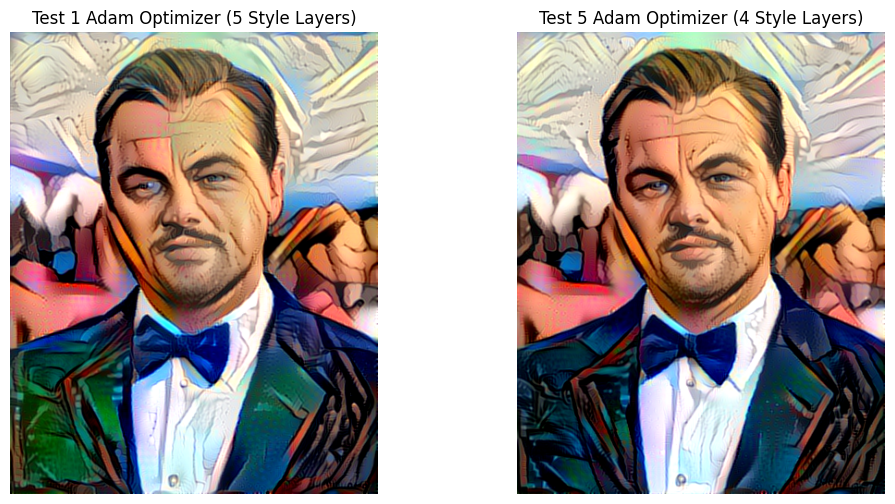

In [54]:
display_images(
    image_paths=["neural-style-transfer/experiment_results/result_4.png", "neural-style-transfer/experiment_results/result_5.png"],
    titles=["Test 1 Adam Optimizer (5 Style Layers)", "Test 5 Adam Optimizer (4 Style Layers)"]
)


Definite improvements were seen in Test 5, with the eyes, forehead, and nose much better pronounced. The image has a clear comic feel while maintaining the recognizable features of the actor. This shows that removing specific blocks from the style layers can significantly affect the output. For instance, while block 5 made little difference, removing block 1 greatly improved the output. The choice of style layers is important to get the balance between style and content in the final image.


## **Test 6 - Adding style layer to SGD Optimizer**


Hyperparameters:

1. Content layer
content_layer_names = ["block4_conv2"]
2. Style layers
style_layer_names = ["block1_conv1", "block2_conv1", "block3_conv1", "block4_conv1", "block5_conv1", "block1_conv2",]

3. total_variation_weight = 1e-6   
4. content_weight = 1e-6             
5. style_weight = 1e-6             

6. Learning Rate
learning_rate = 100.

7. Optimizer = SGD

I felt there was further improvement that could be made to the SGD optimized image as well. So in this test, I set the optimzer as SGD and included more layers into the style. We saw in test 2 that the content image was captured well but we did not see some of the comic like colours that are associated with a comic image. So, style layer block1_conv2 wass included






In [83]:
# HYPERPARAMETERS TO TUNE

# 1. Content layer
content_layer_names = [
    "block5_conv2"
]

 # 2. Style layers
style_layer_names = [
    "block1_conv1",
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1",
    "block1_conv2",

]

# 3. 4. 5. Weights
total_variation_weight = 1e-6
content_weight = 1e-6
style_weight = 1e-6

# 6. Learning Rate
learning_rate = 100.


# Setting up the gradient-descent process
@tf.function # make it fast by compiling the function with @tf.function!
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss, c_loss, s_loss, v_loss = compute_loss(combination_image)
    grads = tape.gradient(loss, combination_image)
    optimizer.apply_gradients([(grads, combination_image)])
    return loss, c_loss, s_loss, v_loss


# 7. Optimizer
# sgd
optimizer = tf.keras.optimizers.SGD(
        tf.keras.optimizers.schedules.ExponentialDecay( # gradually lowers the learning rate!
            initial_learning_rate=learning_rate,
            decay_steps=100,
            decay_rate=0.96
      )
 )


I increased the iterations to 4000 as I originally ran it for 1,000 and the image came out well so I wanted to see if much improvement was made with more iterations.

Iteration 100 | Loss: 24,072.82 | Content: 803.04, Style: 20,885.37, Variation: 2,384.40 | Time: 0.16s
Iteration 200 | Loss: 18,639.79 | Content: 739.31, Style: 15,439.49, Variation: 2,460.99 | Time: 0.16s
Iteration 300 | Loss: 15,354.18 | Content: 692.69, Style: 12,166.13, Variation: 2,495.36 | Time: 0.16s
Iteration 400 | Loss: 13,050.12 | Content: 658.99, Style: 9,879.71, Variation: 2,511.42 | Time: 0.16s
Iteration 500 | Loss: 11,379.46 | Content: 634.72, Style: 8,227.01, Variation: 2,517.73 | Time: 0.16s
Iteration 600 | Loss: 10,159.62 | Content: 616.78, Style: 7,024.98, Variation: 2,517.85 | Time: 0.16s
Iteration 700 | Loss: 9,264.59 | Content: 602.87, Style: 6,147.99, Variation: 2,513.72 | Time: 0.16s
Iteration 800 | Loss: 8,600.72 | Content: 591.52, Style: 5,502.06, Variation: 2,507.14 | Time: 0.17s
Iteration 900 | Loss: 8,108.31 | Content: 581.79, Style: 5,027.39, Variation: 2,499.13 | Time: 0.17s
Iteration 1000 | Loss: 7,741.13 | Content: 573.74, Style: 4,676.53, Variation: 2,4

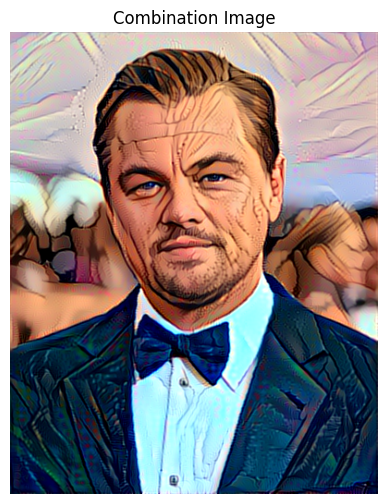

In [85]:
intermediate_images, results_dir, final_image_path = run_experiment_with_intermediate_saves(
    content_weight,
    style_weight,
    total_variation_weight,
    learning_rate,
    iterations=4000, #Amount of iterations
    save_every=100,   #Lower for Smoother GIF
    experiment_id=6,
)

original_image = deprocess_image(preprocess_image(REF_IMAGE)[0])
intermediate_images.insert(0, original_image)

# Create GIF
gif_path = results_dir / "style_transfer6.gif"
create_gif(intermediate_images, gif_path, fps=10)

display_images(
    image_paths=[final_image_path],
    titles=["Combination Image"]
)

In [86]:
#Total duration calc
fps=10
gif_duration = len(intermediate_images) / fps  # Duration in seconds
print(f"Total GIF Duration: {gif_duration:.2f} seconds")

# Display the GIF
display(IPImage(gif_path))

Output hidden; open in https://colab.research.google.com to view.

The image from Test 6 is detailed and higher quality. The additional iterations allowed the model to refine the colours and lines, particularly around the cheeks. This was an improvement from Test 2 (the original SGD-optimized image). The tweaking of hyperparameters improved the output, making this the most visually impressive result so far. The inclusion of extra style layers, combined with the decaying learning rate was an effective combination.

## **Test 7->12 - Tuning weights**

I made a function to run multiple tests looping through different weights. Minor changes in weights were changing up the images completely. You also have to be careful when tuning the weights as the loss can blow up to infinity and no image would be created.

In [ ]:
#Hyperparameters

# 1. Content layer
content_layer_names = [
    "block5_conv2",
]

 # 2. Style layers
style_layer_names = [
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1"
]

#Define experiment parameters
content_weights = [1e-6]                  # Keep constant
style_weights = [1e-5, 5e-5, 1e-4]  # Incrementally increase style weight
total_variation_weights = [1e-6, 1e-5]          # increased variation weight
learning_rates = [100.0]                  # Keep constant


# Setting up the gradient-descent process
@tf.function # make it fast by compiling the function with @tf.function!
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss, c_loss, s_loss, v_loss = compute_loss(combination_image)
    grads = tape.gradient(loss, combination_image)
    optimizer.apply_gradients([(grads, combination_image)])
    return loss, c_loss, s_loss, v_loss


# 7. Optimizer
# ADAM
optimizer = tf.keras.optimizers.Adam(
    learning_rate=learning_rate,
    beta_1=0.95,
    epsilon=1e-1
)

Function to run further tests iteratively.

*Note: Change counter to what number test you are on. In my case it was test 7.*

In [87]:
from pathlib import Path

# Function to run multiple experiments
def run_tuning_experiment(content_weight, style_weight, tv_weight, lr, experiment_id):
    #  Run the experiment
    print(f"Running Experiment {experiment_id}:")
    print(f"Content Weight: {content_weight}, Style Weight: {style_weight}, TV Weight: {tv_weight}, LR: {lr}")

    intermediate_images, results_dir, final_image_path = run_experiment_with_intermediate_saves(
        content_weight=content_weight,
        style_weight=style_weight,
        total_variation_weight=tv_weight,
        learning_rate=lr,
        iterations=1000,
        save_every=1000,
        experiment_id=experiment_id
    )

    return final_image_path

# Main loop to iterate through hyperparameters
counter = 7                                        #### Starting from test 7
for content_weight in content_weights:
    for style_weight in style_weights:
        for tv_weight in total_variation_weights:
            for lr in learning_rates:
                final_image= run_tuning_experiment(
                    content_weight=content_weight,
                    style_weight=style_weight,
                    tv_weight=tv_weight,
                    lr=lr,
                    experiment_id=counter
                )
                counter += 1


Running Experiment 7:
Content Weight: 1e-06, Style Weight: 1e-05, TV Weight: 1e-06, LR: 100.0
Iteration 1000 | Loss: 19,963.69 | Content: 1,589.80, Style: 12,822.67, Variation: 5,551.22 | Time: 0.15s
Final image saved at: neural-style-transfer/experiment_results/result_7.png
Running Experiment 8:
Content Weight: 1e-06, Style Weight: 1e-05, TV Weight: 1e-05, LR: 100.0
Iteration 1000 | Loss: 86,271.34 | Content: 2,172.68, Style: 72,986.28, Variation: 11,112.38 | Time: 0.16s
Final image saved at: neural-style-transfer/experiment_results/result_8.png
Running Experiment 9:
Content Weight: 1e-06, Style Weight: 5e-05, TV Weight: 1e-06, LR: 100.0
Iteration 1000 | Loss: 21,103.77 | Content: 1,899.84, Style: 13,219.47, Variation: 5,984.46 | Time: 0.16s
Final image saved at: neural-style-transfer/experiment_results/result_9.png
Running Experiment 10:
Content Weight: 1e-06, Style Weight: 5e-05, TV Weight: 1e-05, LR: 100.0
Iteration 1000 | Loss: 29,714.80 | Content: 1,859.66, Style: 20,135.25, Vari

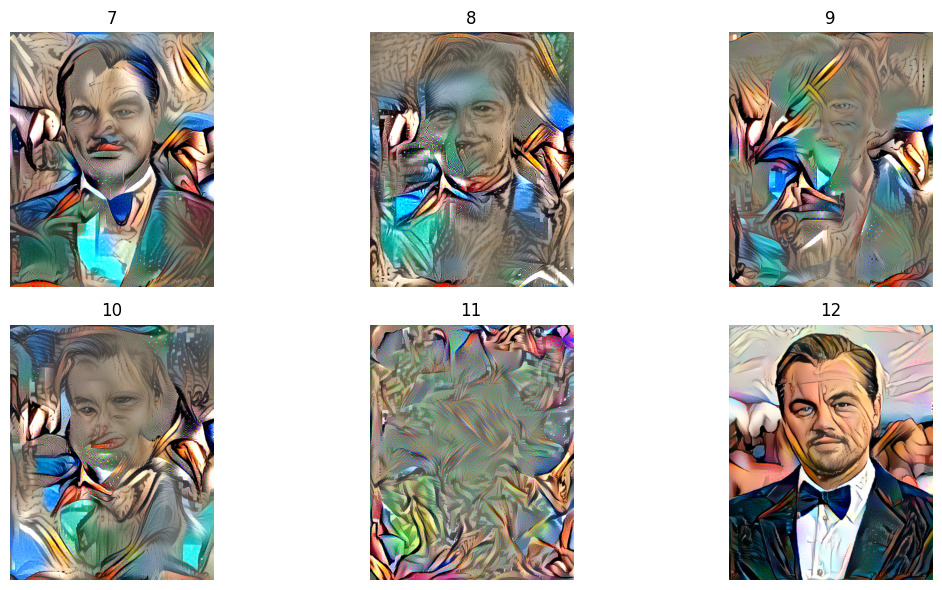

In [92]:
base_path = Path("neural-style-transfer/experiment_results")

image_paths = sorted(
    [path for path in base_path.glob("result_*.png") if int(path.stem.split("_")[1]) > 6],
    key=lambda path: int(path.stem.split("_")[1])
)

titles = [path.stem.split("_")[1] for path in image_paths]

# Function to display images in rows
def display_images_more(image_paths, titles=None, images_per_row=3, figsize=(12, 6)):
    num_images = len(image_paths)
    num_rows = (num_images + images_per_row - 1) // images_per_row

    plt.figure(figsize=figsize)

    for i, image_path in enumerate(image_paths):
        plt.subplot(num_rows, images_per_row, i + 1)
        plt.axis('off')
        if titles and i < len(titles):
            plt.title(titles[i])
        plt.imshow(tf.keras.utils.load_img(image_path))

    plt.tight_layout()
    plt.show()

# Display all images neatly
display_images_more(image_paths=image_paths, titles=titles)


Even with slight adjustments to the weights, the resulting images became heavily distorted and unrecognizable. The loss values were significantly large, showing the sensitivity of the model to hyperparameter tuning.

## **Test 13 - Low Learning Rate, High Iterations**

Hyperparameters:

1. Content layer
content_layer_names = ["block4_conv2"]
2. Style layers
style_layer_names = ["block2_conv1", "block3_conv1", "block4_conv1", "block5_conv1"]

3. total_variation_weight = 1e-6   
4. content_weight = 1e-6             
5. style_weight = 1e-6             

6. Learning Rate
learning_rate = 5.

7. Optimizer = Adam

This was the final test performed. Lowering the learning rate to 5 and setting the iteration to 3,000, I wanted to see how the ADAM optimized image would respond. To make a longer gif of the process I lowered the save frequency from 50 to 10.  


In [116]:
# HYPERPARAMETERS TO TUNE

# 1. Content layer
content_layer_names = [
    "block5_conv2",
]

 # 2. Style layers
style_layer_names = [
    "block2_conv1",
    "block3_conv1",
    "block4_conv1",
    "block5_conv1"
]
# 3. 4. 5. Weights
total_variation_weight = 1e-6
content_weight = 1e-6
style_weight = 1e-6
learning_rates = 5.


# Setting up the gradient-descent process
@tf.function # make it fast by compiling the function with @tf.function!
def compute_loss_and_grads(combination_image, base_image, style_reference_image):
    with tf.GradientTape() as tape:
        loss, c_loss, s_loss, v_loss = compute_loss(combination_image)
    grads = tape.gradient(loss, combination_image)
    optimizer.apply_gradients([(grads, combination_image)])
    return loss, c_loss, s_loss, v_loss


# 7. Optimizer
# ADAM
optimizer = tf.keras.optimizers.Adam(
    learning_rate=learning_rate,
    beta_1=0.95,
    epsilon=1e-1
)

In [117]:
intermediate_images, results_dir, final_image_path = run_experiment_with_intermediate_saves(
    content_weight,
    style_weight,
    total_variation_weight,
    learning_rate,
    iterations=3000, #Amount of iterations
    save_every=10,   #Lower for Smoother GIF
    experiment_id=13,
)

# original_image = deprocess_image(preprocess_image(REF_IMAGE)[0])
# intermediate_images.insert(0, original_image)

# Create GIF
gif_path = results_dir / "style_transfer13.gif"
create_gif(intermediate_images, gif_path, fps=10)

display_images(
    image_paths=[final_image_path],
    titles=["Combination Image"]
)

#Total duration calc
fps=20 # Increased due to amount of images saved
gif_duration = len(intermediate_images) / fps  # Duration in seconds
print(f"Total GIF Duration: {gif_duration:.2f} seconds")

# Display the GIF
display(IPImage(gif_path))

Output hidden; open in https://colab.research.google.com to view.

In [118]:
#Total duration calc
fps=20
gif_duration = len(intermediate_images) / fps  # Duration in seconds
print(f"Total GIF Duration: {gif_duration:.2f} seconds")

# Display the GIF
display(IPImage(gif_path))

Output hidden; open in https://colab.research.google.com to view.

The output was good, with a nice GIF that shows the algorithm gradually improving the finer details with each iteration. One unique aspect of this image was how it captured a comic book-like shine on the right side of the forehead. This lighting effect is like that often seen in comic art, and none of the previous tests managed to replicate this effect.

However, the lines in this image are slightly weaker compared to more defined lines seen in test 6. Determining which image is the best is challenging, as it depends on what you are looking for. Both images have their own strengths.

---
# **4. Conclusion**

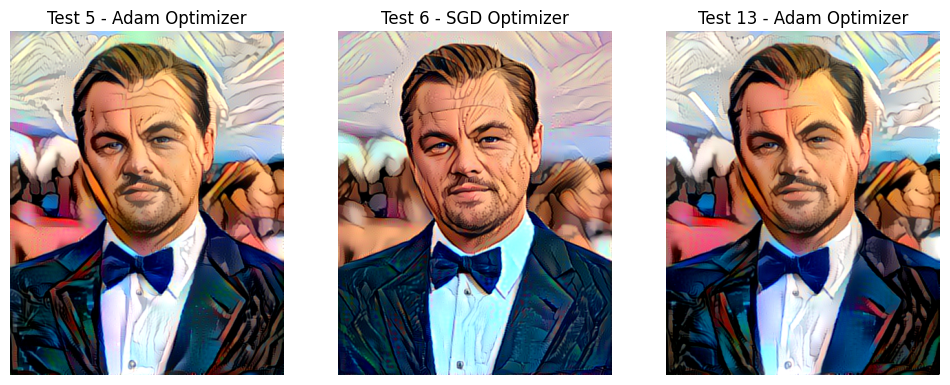

In [122]:
# Best Results
display_images(
    image_paths=["neural-style-transfer/experiment_results/result_5.png",
                 "neural-style-transfer/experiment_results/result_6.png",
                 "neural-style-transfer/experiment_results/result_13.png"
                 ],

    titles=["Test 5 - Adam Optimizer",
            "Test 6 - SGD Optimizer",
            "Test 13 - Adam Optimizer"
            ])

Test 5, 6, and 13 produced the most impressive images overall. Among them, Test 6 stands out as the best, as it closely aligns with the look of a comic book. The image has well-defined facial features and prominent drawn lines that are characteristic of comic book art.

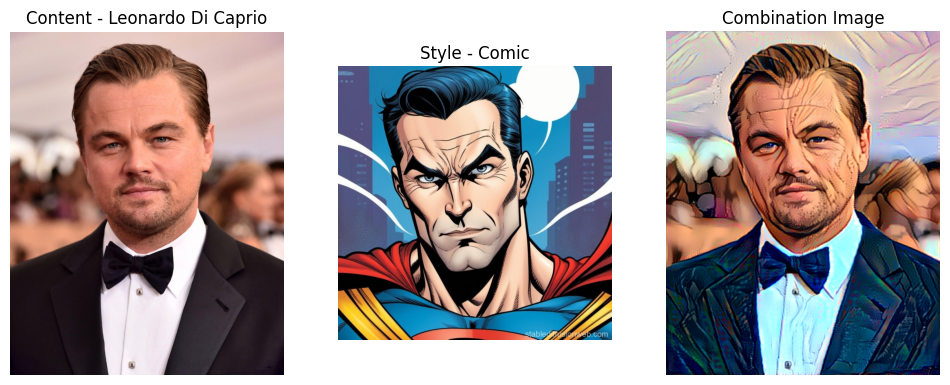

In [129]:
display_images(
    image_paths=[REF_IMAGE, STYLE_IMAGE, "neural-style-transfer/experiment_results/result_6.png"],
    titles=["Content - Leonardo Di Caprio", "Style - Comic" , "Combination Image",]
)

In [126]:
# Display Best GIF
display(IPImage("neural-style-transfer/experiment_results/style_transfer6.gif"))

Output hidden; open in https://colab.research.google.com to view.

Above is the gif I had teasered in the opening of this project.

This project explored neural style transfer to create stylized images by blending the structure of a content image with the artistic style of another image.

Key findings include the importance of tuning hyperparameters such as the content layers, stye layers, content weight, style weight, total variation weight, learning rate and optimizers to achieve a balance between preserving the content and incorporating the style. The choice of optimizer (Adam versus SGD), also had a noticeable impact on the quality of the output, with each producing distinct strengths in terms of colour, detail, and structure. Additionally, the iterative visualization through GIFs provided a nice visualisation as to how the model improves details with each step.

Future work could involve experimenting with other styles (simpsons, pixar, etc.). Also, automation in the testing phase could be better if you have more time and computation power. I was restricted in the amount of computation I could achieve and therefore I had to be paticular in the hyperparamters I chose and tuned. One could also do more tuning of the actual optimizers (decay rate e, beta 1, epsion, etc). I tried a few different settings but I was mainly focused on the tuning of the overall hyperparameters.

In conclusion, neural style transfer is a powerful tool for artistic image generation, and this project demonstrated its potential to produce high-quality stylized outputs.


Overall, I'd say the neural style transfer from celebrity to comic style was a success! Leonardo DiCaprio could easily pass as a comic book supervillain, as shown in the fun image below.



<img src="https://github.com/EoinHoustoun/Eoin_Houstoun/blob/master/comic_strip.png?raw=true" alt="Comic Book Leo" width="600">



# **References**

1. Leon A. Gatys, Alexander S. Ecker, and Matthias Bethge, “[A Neural Algorithm of Artistic Style,](https://arxiv.org/abs/1508.06576)” *arXiv* (2015).
2. François Chollet, [Deep Learning with Python, Second Edition](https://sourestdeeds.github.io/pdf/Deep%20Learning%20with%20Python.pdf) (2021).
3.  Zhang, Aston; Lipton, Zachary; Li, Mu; Smola, Alexander J. (2024). [14.12. Neural Style Transfer](https://d2l.ai/chapter_computer-vision/neural-style.html)". Dive into deep learning. Cambridge New York Port Melbourne New Delhi Singapore: Cambridge University Press.
4. L. A. Gatys, A. S. Ecker and M. Bethge, "[Image Style Transfer Using Convolutional Neural Networks](https://ieeexplore.ieee.org/document/7780634)" 2016 IEEE Conference on Computer Vision and Pattern Recognition (CVPR), Las Vegas, NV, USA, 2016, pp. 2414-2423
5. Pretrained [VGG19 model](https://keras.io/api/applications/vgg/)